In [ ]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
from os.path import join
import io

from google.colab import drive
drive.mount("/content/drive", force_remount=True)
path_prefix = "/content/drive/My Drive"

Mounted at /content/drive


In [ ]:
agent_df=pd.read_csv(join(path_prefix, "agent.csv"))

agent_df.head()

,AgentID,AgentX,AgentY,TimeInSeconds
0,39670,-171.891,-19.879,28903.5
1,39670,-163.132,-17.741,28904.9
2,39670,-156.743,-16.181,28906.0
3,39670,-156.743,-16.181,28907.2
4,44563,-181.220,-4.682,28938.0


In [ ]:
building_df=pd.read_csv(join(path_prefix, "building.csv"))
building_df.head()

,BuildingID,BuildingX,BuildingY,DoorID,DoorX,DoorY
0,Sport Center,276.55,-56.71,SGM Door 1,267.732,-64.548
1,FMAN,-87.30,-42.50,FMAN Door 1,-128.022,-85.397
2,FMAN,-87.30,-42.50,FMAN Door 2,-153.030,-14.869
3,FMAN,-87.30,-42.50,FMAN Door 3,-40.920,-10.438
4,FMAN,-87.30,-42.50,FMAN Door 4,-35.755,-26.845


In [ ]:
building_df.columns

Index(['BuildingID', ' BuildingX', ' BuildingY', ' DoorID', ' DoorX',
       ' DoorY'],
      dtype='object')

In [ ]:
array=agent_df[ "AgentID"].unique()
array.size

2584

In [ ]:
df1 = {'A': [1, 2, 3, 4], 
         'B': ['abc', 'def', 'efg', 'ghi']}  
df2 = {'A': [1, 2, 3, 4 ], 
         'B': ['Geeks', 'For', 'efg', 'ghi'], 
         'C':['Nikhil', 'Rishabh', 'Rahul', 'Shubham']}  
           
d1 = pd.DataFrame(df1) 
d2 = pd.DataFrame(df2)  
  
# Calling merge() function 
int_df = pd.merge(d1, d2, how ='inner', on =['A', 'B']) 
print(int_df) 

In [ ]:
temp_df = agent_df.rename({" AgentX":" DoorX"," AgentY":" DoorY"}, axis='columns') 
temp_df.head()

##Merge için column isimlerş aynı olmalı diye burda gecici temp olarsk degistirdim

,AgentID,DoorX,DoorY,TimeInSeconds
0,39670,-171.891,-19.879,28903.5
1,39670,-163.132,-17.741,28904.9
2,39670,-156.743,-16.181,28906.0
3,39670,-156.743,-16.181,28907.2
4,44563,-181.220,-4.682,28938.0


In [ ]:
int_df = pd.merge(temp_df,building_df,how="inner",on=[ " DoorX"," DoorY"])
print (int_df)
smt= int_df["AgentID"].unique()
smt.size

     AgentID    DoorX    DoorY  ...   BuildingX  BuildingY       DoorID
0      43561 -220.663   -3.839  ...      -217.5      -31.9    UC Door 3
1      38815 -220.663   -3.839  ...      -217.5      -31.9    UC Door 3
2      23787 -220.663   -3.839  ...      -217.5      -31.9    UC Door 3
3      20643 -220.663   -3.839  ...      -217.5      -31.9    UC Door 3
4      25695 -220.663   -3.839  ...      -217.5      -31.9    UC Door 3
..       ...      ...      ...  ...         ...        ...          ...
429    51382  -79.702  230.407  ...       -18.2      219.6  FASS Door 3
430    23206  -40.920  -10.438  ...       -87.3      -42.5  FMAN Door 3
431    43838 -111.990  223.143  ...      -156.1      181.0  FENS Door 8
432     7766 -128.022  -85.397  ...       -87.3      -42.5  FMAN Door 1
433    43176 -122.389  131.724  ...      -156.1      181.0  FENS Door 5

[434 rows x 8 columns]


402

In [ ]:
agent_df.head()


,AgentID,AgentX,AgentY,TimeInSeconds
0,39670,-171.891,-19.879,28903.5
1,39670,-163.132,-17.741,28904.9
2,39670,-156.743,-16.181,28906.0
3,39670,-156.743,-16.181,28907.2
4,44563,-181.220,-4.682,28938.0


In [ ]:
def DensityMap(stations, cnt_departure, cnt_arrival):
  Sabanci = [40.892781855938026, 29.377431512940387]
  
  map = folium.Map(location = Sabanci, 
                   zoom_start = 12, 
                   tiles = "CartoDB dark_matter")
  
  stations['Total Departure'] = cnt_departure
  stations['Total Arrival'] = cnt_arrival
  for index, row in stations.iterrows():
      net_departure = row['Total Departure'] - row['Total Arrival']
    
      _radius = np.abs(net_departure) 
      if np.isnan(_radius):
       _radius = 0
    
      if net_departure > 0:
       _color= '#E80018' # target red
      else:
       _color= '#81D8D0' # tiffany blue
  
      lat, lon = row['lat'], row['lon']
      _popup = '('+str(row['capacity'])+'/'+str(int(_radius))+') '+row['station_name']
  
      folium.CircleMarker(location = [lat,lon], 
                          radius = _radius, 
                          popup = _popup, 
                          color = _color, 
                          fill_opacity = 0.5).add_to(map)
  return map

In [ ]:
pip install geopandas

     |████████████████████████████████| 972kB 5.3MB/s 
     |████████████████████████████████| 14.8MB 275kB/s 
     |████████████████████████████████| 6.5MB 30.8MB/s 


In [ ]:
import descartes
import geopandas as gpd
from shapely.geometry import Polygon,Point
%matplotlib inline
from scipy import ndimage

In [ ]:
geometry=[Point(xy)for xy in zip(building_df[" BuildingX"],building_df[" BuildingY"])]
geometry[:3]

In [ ]:
geo_df=gpd.GeoDataFrame(building_df, geometry=geometry)
geo_df.head()

,BuildingID,BuildingX,BuildingY,DoorID,DoorX,DoorY,geometry
0,Sport Center,276.55,-56.71,SGM Door 1,267.732,-64.548,POINT (276.550 -56.710)
1,FMAN,-87.30,-42.50,FMAN Door 1,-128.022,-85.397,POINT (-87.300 -42.500)
2,FMAN,-87.30,-42.50,FMAN Door 2,-153.030,-14.869,POINT (-87.300 -42.500)
3,FMAN,-87.30,-42.50,FMAN Door 3,-40.920,-10.438,POINT (-87.300 -42.500)
4,FMAN,-87.30,-42.50,FMAN Door 4,-35.755,-26.845,POINT (-87.300 -42.500)


[<shapely.geometry.point.Point object at 0x7f3e7ec3c780>, <shapely.geometry.point.Point object at 0x7f3e76f75550>, <shapely.geometry.point.Point object at 0x7f3e76f757f0>, <shapely.geometry.point.Point object at 0x7f3e76f75240>, <shapely.geometry.point.Point object at 0x7f3e76f755c0>, <shapely.geometry.point.Point object at 0x7f3e76f75470>, <shapely.geometry.point.Point object at 0x7f3e76f75400>, <shapely.geometry.point.Point object at 0x7f3e76f75a58>, <shapely.geometry.point.Point object at 0x7f3e76f75fd0>, <shapely.geometry.point.Point object at 0x7f3e76f752e8>, <shapely.geometry.point.Point object at 0x7f3e76f75898>, <shapely.geometry.point.Point object at 0x7f3e76f75be0>, <shapely.geometry.point.Point object at 0x7f3e76f758d0>, <shapely.geometry.point.Point object at 0x7f3e76f75b00>, <shapely.geometry.point.Point object at 0x7f3e76f750b8>, <shapely.geometry.point.Point object at 0x7f3e76f754a8>, <shapely.geometry.point.Point object at 0x7f3e76f75ba8>, <shapely.geometry.point.Point 

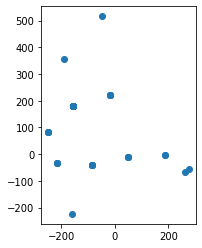

In [ ]:
print (geometry)
geo_df.plot()


In [ ]:
def heatmap(d, bins=(100,100), smoothing=1.3, cmap='jet'):
    def getx(pt):
        return pt.coords[0][0]

    def gety(pt):
        return pt.coords[0][1]

    x = list(d.geometry.apply(getx))
    y = list(d.geometry.apply(gety))
    heatmap, xedges, yedges = np.histogram2d(y, x, bins=bins)
    extent = [yedges[0], yedges[-1], xedges[-1], xedges[0]]

    logheatmap = np.log(heatmap)
    logheatmap[np.isneginf(logheatmap)] = 0
    logheatmap = ndimage.filters.gaussian_filter(logheatmap, smoothing, mode='nearest')
    
    plt.imshow(logheatmap, cmap=cmap, extent=extent)
    plt.colorbar()
    plt.gca().invert_yaxis()
    plt.show()

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:13: RuntimeWarning: divide by zero encountered in log
  del sys.path[0]


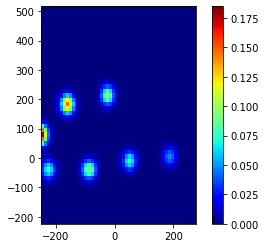

In [ ]:
heatmap(geo_df, bins=50, smoothing=1.5)

In [ ]:
geometry2=[Point(xy)for xy in zip(agent_df[" AgentX"],agent_df[" AgentY"])]
geometry2[:3]

In [ ]:
geo_df2=gpd.GeoDataFrame(agent_df, geometry=geometry2)
geo_df2.head()

,AgentID,AgentX,AgentY,TimeInSeconds,geometry
0,39670,-171.891,-19.879,28903.5,POINT (-171.891 -19.879)
1,39670,-163.132,-17.741,28904.9,POINT (-163.132 -17.741)
2,39670,-156.743,-16.181,28906.0,POINT (-156.743 -16.181)
3,39670,-156.743,-16.181,28907.2,POINT (-156.743 -16.181)
4,44563,-181.220,-4.682,28938.0,POINT (-181.220 -4.682)


IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



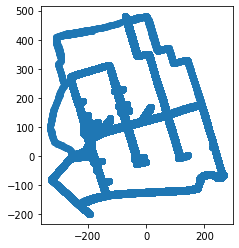

In [ ]:
print (geometry2)
geo_df2.plot()

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:13: RuntimeWarning: divide by zero encountered in log
  del sys.path[0]


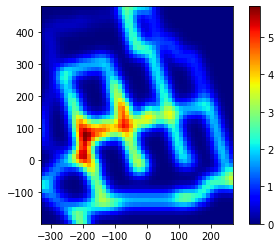

In [ ]:
heatmap(geo_df2, bins=50, smoothing=1.5)

In [ ]:
agent_df[" TimeInSeconds"]



0         28903.5
1         28904.9
2         28906.0
3         28907.2
4         28938.0
           ...   
414705    84725.7
414706    84726.5
414707    84727.5
414708    84728.3
414709    84729.3
Name:  TimeInSeconds, Length: 414710, dtype: float64

In [ ]:
def time_categorizer(time):
  if time < 43200:  #time until noon 12pm
        return "Morning"
  elif 43200 <= time < 61200:    #time between 12pm-5pm 
      return "Afternoon"
  elif 61200 <= time < 75600:   #time between 5-9pm Evening
      return "Evening"
  else:
      return "Night"



agent_df["TimeOfDay"] = agent_df[" TimeInSeconds"].apply(time_categorizer)
#agent_df["TimeOfDay"].count().plot(kind="hist", bins=8, rwidth=0.8) #also can plot histogram
print(agent_df["TimeOfDay"] , agent_df[" TimeInSeconds"])

0         Morning
1         Morning
2         Morning
3         Morning
4         Morning
           ...   
414705      Night
414706      Night
414707      Night
414708      Night
414709      Night
Name: TimeOfDay, Length: 414710, dtype: object 0         28903.5
1         28904.9
2         28906.0
3         28907.2
4         28938.0
           ...   
414705    84725.7
414706    84726.5
414707    84727.5
414708    84728.3
414709    84729.3
Name:  TimeInSeconds, Length: 414710, dtype: float64


In [ ]:
agent_df.head(100000)

,AgentID,AgentX,AgentY,TimeInSeconds,geometry,TimeOfDay
0,39670,-171.891,-19.879,28903.5,POINT (-171.891 -19.879),Morning
1,39670,-163.132,-17.741,28904.9,POINT (-163.132 -17.741),Morning
2,39670,-156.743,-16.181,28906.0,POINT (-156.743 -16.181),Morning
3,39670,-156.743,-16.181,28907.2,POINT (-156.743 -16.181),Morning
4,44563,-181.220,-4.682,28938.0,POINT (-181.220 -4.682),Morning
...,...,...,...,...,...,...
99995,16810,-213.860,-181.591,44200.4,POINT (-213.860 -181.591),Afternoon
99996,22691,-203.025,139.008,44201.7,POINT (-203.025 139.008),Afternoon
99997,44783,-37.087,115.767,44201.7,POINT (-37.087 115.767),Afternoon
99998,27907,-183.469,-11.936,44201.7,POINT (-183.469 -11.936),Afternoon


In [ ]:
import folium
from folium.plugins import HeatMap

location = agent_df[[" AgentX", " AgentY"]].dropna(how="any").values

map1= folium.Map()
HeatMap(location).add_to(map1)
map1

In [ ]:
from folium.plugins import HeatMapWithTime

location2 = agent_df[[" AgentX", " AgentY"]].dropna(how="any").values

map2= folium.Map()
HeatMapWithTime(location,).add_to(map2)
map1